In [1]:
#libraries and necessary packages

#basic
import numpy as np
import pandas as pd

#visualization
import seaborn as sns
import matplotlib.pyplot as plt

#document processing
from csv import DictReader, reader
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import CountVectorizer

#folder navigation
import os

#sentiment analysis
import text2emotion as te

#Topic modeling
from sklearn.decomposition import LatentDirichletAllocation
import warnings
warnings.filterwarnings('ignore')


[nltk_data] Downloading package stopwords to /Users/lsx/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/lsx/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/lsx/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
import os
import numpy as np
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import cmudict
!pip install syllables
import syllables
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from collections import Counter


In [3]:
dataset = pd.read_csv('/Users/lsx/Desktop/5243 applied ds /assignments/philosophy_data.csv')

## Data exploration

In [4]:
#exploring timeline of publications

dataset_sorted =dataset.sort_values(by=['original_publication_date'])
timeline_school = dataset.loc[:, ['school', 'original_publication_date']].drop_duplicates()



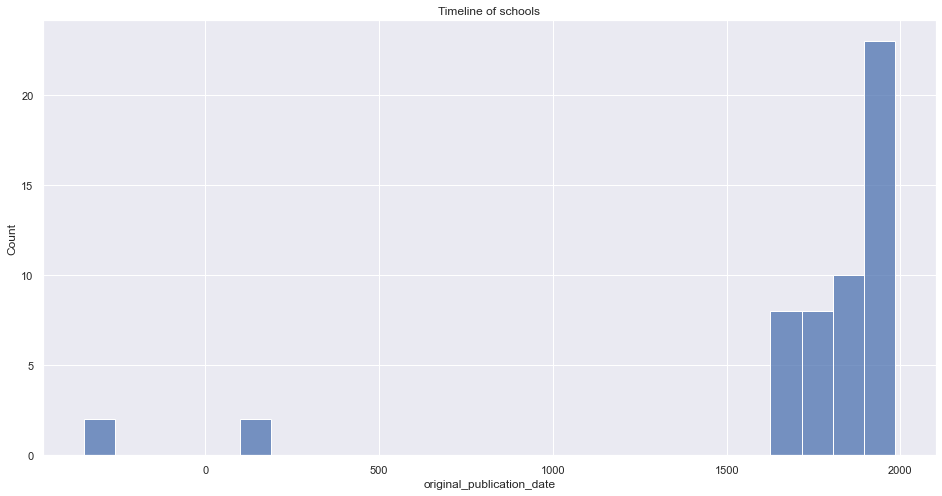

In [5]:
sns.set(style="darkgrid")
sns.set(rc = {'figure.figsize':(16,8)})
sns.histplot(data=timeline_school, x="original_publication_date" )
plt.title('Timeline of schools')

path = "/Users/lsx/Desktop/Timeline of schools.png"
plt.savefig(path, bbox_inches="tight")

plt.show()

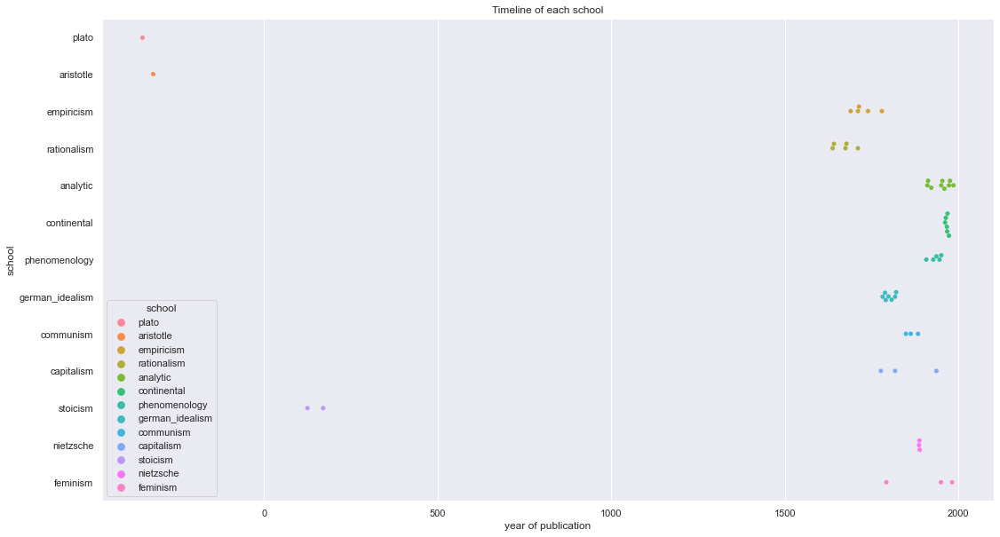

In [6]:
sns.set_theme(style="whitegrid", palette="dark")
sns.set(rc={'figure.figsize':(18,10)})
sns.swarmplot(data=timeline_school,
              x="original_publication_date",
              y="school", hue="school").set(title='Timeline of each school', xlabel='year of publication')

path = "/Users/lsx/Desktop/Timeline of schools2.png"
plt.savefig(path, bbox_inches="tight")

plt.show()



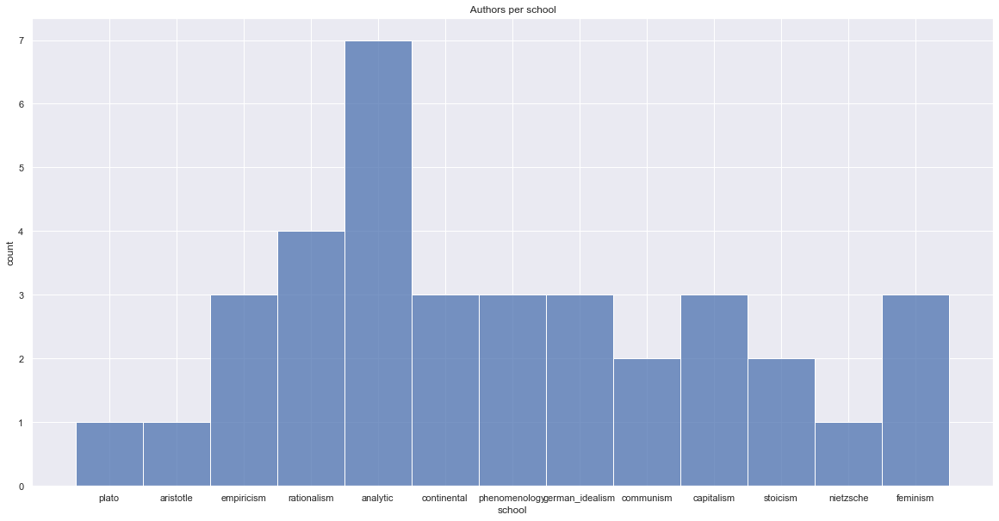

In [7]:
#Number of authors represinting each school
authors_per_school = dataset.loc[:, ['school', 'author']].drop_duplicates()
authors_per_school_count = authors_per_school['school'].value_counts()
authors_per_school_count

sns.set(rc={'figure.figsize':(20,10)})
sns.histplot(data=authors_per_school,
             x="school").set(ylabel='count',title=' Authors per school');

path = "/Users/lsx/Desktop/Authors per school.png"
plt.savefig(path, bbox_inches="tight")

plt.show()

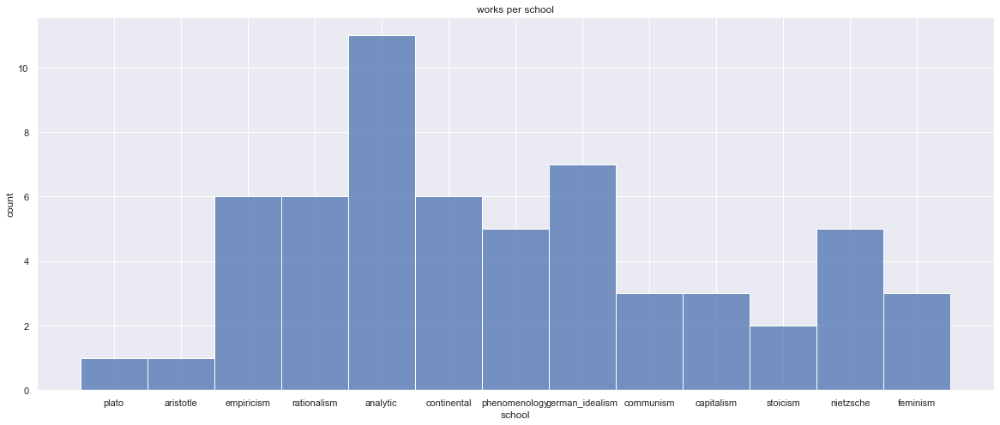

In [8]:
##Timeline of works for each school
texts_per_school =dataset.loc[:, ['school', 'title']].drop_duplicates()
texts_per_school_count=texts_per_school['school'].value_counts()


sns.set(rc={'figure.figsize':(20,8)})
sns.histplot(data=texts_per_school, 
              x="school").set(ylabel='count',title='works per school')

path = "/Users/lsx/Desktop/works per school.png"
plt.savefig(path, bbox_inches="tight")

plt.show()

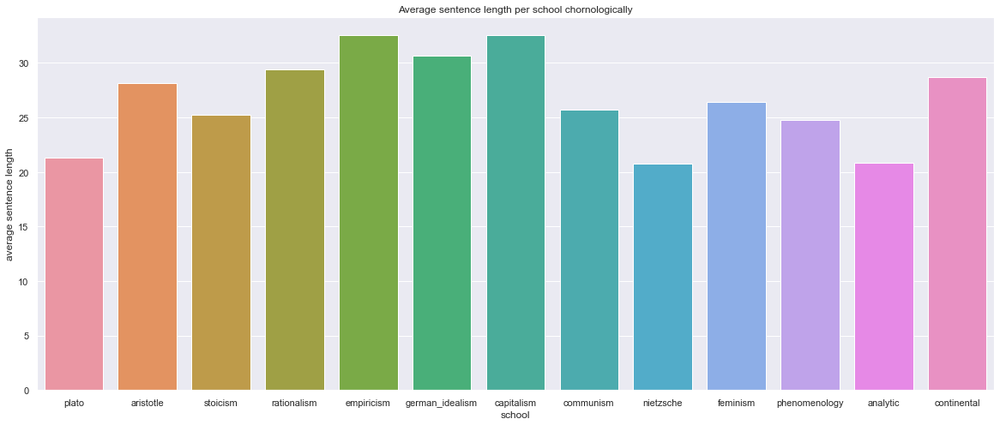

In [9]:
#sentence length visualization

dataset['new_sentence_length'] =dataset.apply(lambda row: len(row.sentence_str.split()), axis=1)
dataset_sorted = dataset.sort_values(by=['original_publication_date'])
#fing avg sentence length per school
mean_df = dataset_sorted.groupby("school")['new_sentence_length' , 'original_publication_date' ].mean()
mean_df = mean_df.reset_index()
#sort chronologically
mean_df = mean_df.sort_values(by=['original_publication_date'])

sns.set(rc={'figure.figsize':(20,8)})
sns.barplot(data=mean_df, x="school", 
            y="new_sentence_length").set(ylabel='average sentence length', title='Average sentence length per school chornologically');

path = "/Users/lsx/Desktop/Average sentence length per school.png"
plt.savefig(path, bbox_inches="tight")
plt.show()
chronological_order = mean_df['school'].values.tolist()

## Data processing

In [11]:
dataset2=dataset

dataset2['new_lowered_sentence'] =dataset.apply (lambda row: row.sentence_str.lower(), axis=1)

def remove_punctuation(text):
     punctuations = '''!()[]{};«№»:'"\,`<>./?@=#$-(%^)+&[*_]~'''
     no_punct = ""
     for char in text:
        if char not in punctuations:
            no_punct = no_punct + char
     return no_punct

dataset2['new_lowered_sentence'] = dataset.apply(lambda row: remove_punctuation(row.new_lowered_sentence), axis=1)

#remove punctuations when tokenizing
tokenizer = nltk.RegexpTokenizer(r"\w+") 
dataset2['new_tokenized_sentence'] = dataset.apply (lambda row: tokenizer.tokenize(row.new_lowered_sentence), axis=1)


def remove_stopwords(word_tokens):
    stop_words = set(stopwords.words('english'))
    return [w for w in word_tokens if w.lower() not in stop_words]

dataset2['tokens_without_stop_words'] = dataset2.apply(lambda row: remove_stopwords(row.new_tokenized_sentence), axis=1)

#lemmatizing words
def lem_sentence(word_tokens):
    pos_map = {'J': 'a', 'N': 'n', 'R': 'r', 'V': 'v'}
    pos_tags_list = pos_tag(word_tokens)
    lemmatizer = WordNetLemmatizer()
    return [lemmatizer.lemmatize(w, pos=pos_map.get(p[0], 'v')) for w, p in pos_tags_list]

dataset2['lemmatized_tokens'] = dataset2.apply(lambda row: lem_sentence(row.tokens_without_stop_words), axis=1)

#additional stop words that we removed
additional_stop_words = ['go', 'sure', 'new', 'list', 'back', 'say', 'one', 'two', 'without', 'much',
                        'whose', 'therefor', 'first', 'within', 'yet', 'would', 'also', 'second', 'whats',
                        'us', 'secondly', 'may', 'upon', 'more', 'thus', 'mine', 'thou', 'thy', 'thee', 'dont']

def remove_additional_stopwords(word_tokens):
    stop_words = set(additional_stop_words)
    return [w for w in word_tokens if w.lower() not in stop_words]

dataset2['lem_tokens_without_additional_stop_words'] = dataset2.apply(
    lambda row: remove_additional_stopwords(row.lemmatized_tokens), axis=1
)
dataset2['lem_sentence_without_additional_stop_words'] = dataset2.apply(
    lambda row: " ".join(row.lem_tokens_without_additional_stop_words), axis=1
)


# create data frame with the important columns

important_columns = ["title", "author", "school",
                 "original_publication_date", "corpus_edition_date",
                 "new_lowered_sentence", "lem_sentence_without_additional_stop_words"]

df = dataset2.loc[:, important_columns].copy(deep=True)


## Workclouds

In [12]:
def display_wordcloud(data, title, color='white', save_fig_path=None):
    wordcloud = WordCloud(background_color=color,
                      stopwords = set(STOPWORDS),
                      max_words=400,
                      max_font_size=60,
                      scale=3,
                      random_state=42
                      ).generate(data)
    fig = plt.figure(1, figsize=(10, 10))
    plt.imshow(wordcloud)
    plt.axis("off")
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
    
   
   

    plt.show()
    
    
    
    

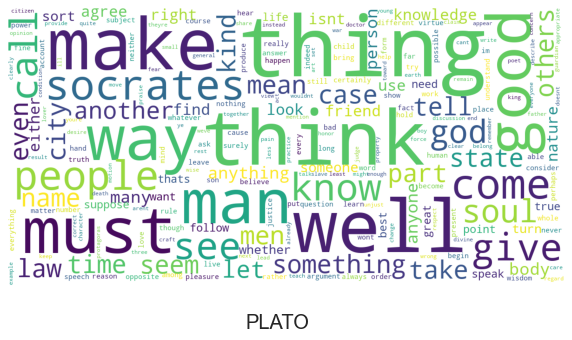

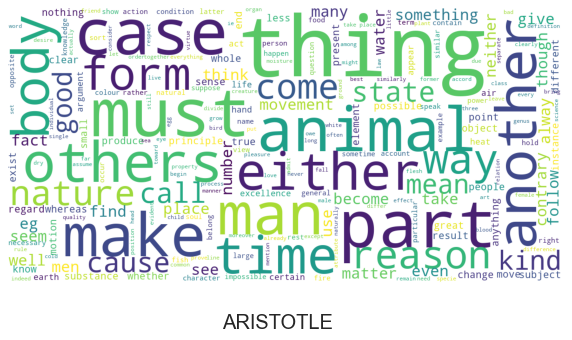

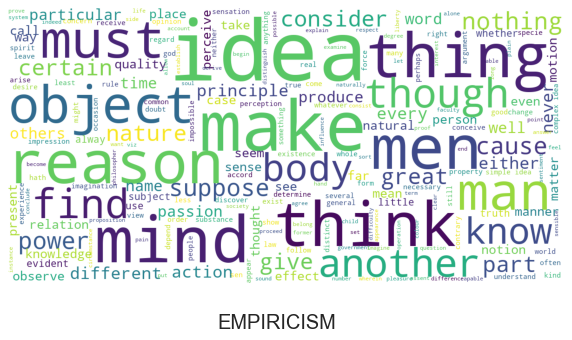

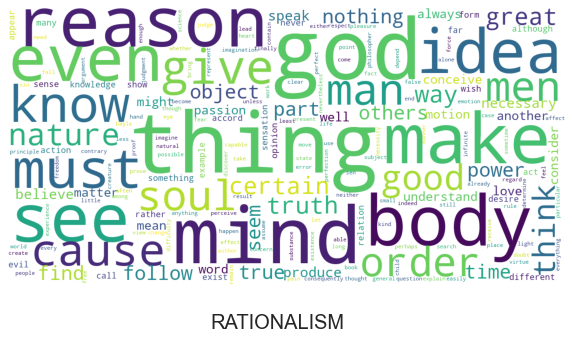

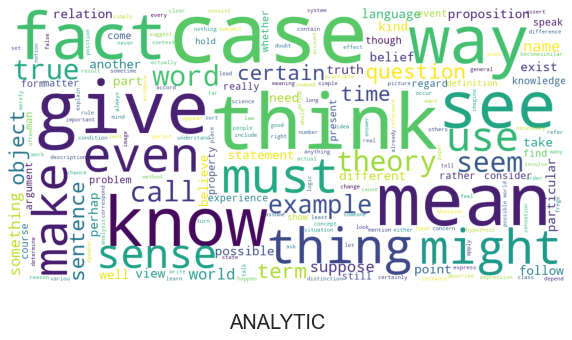

...

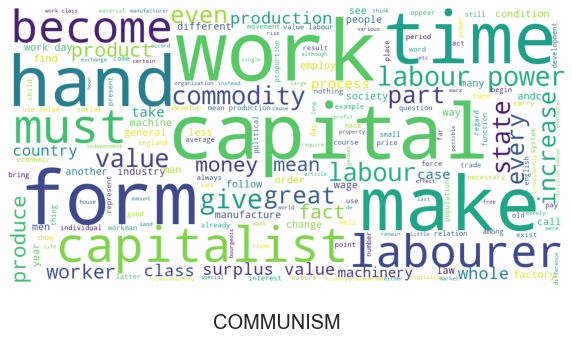

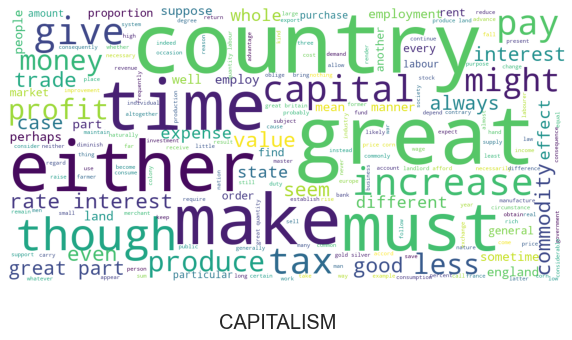

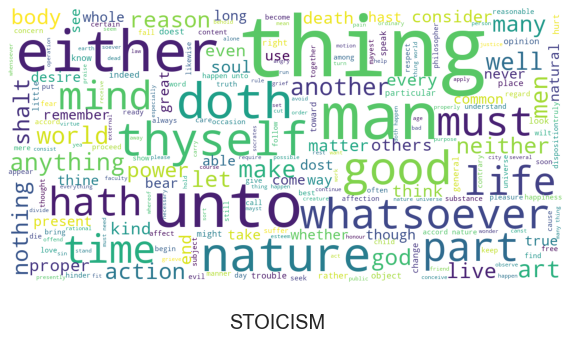

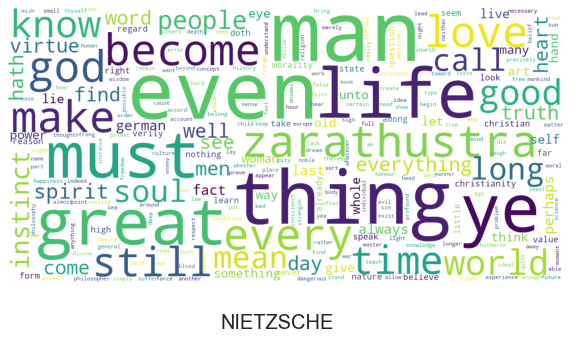

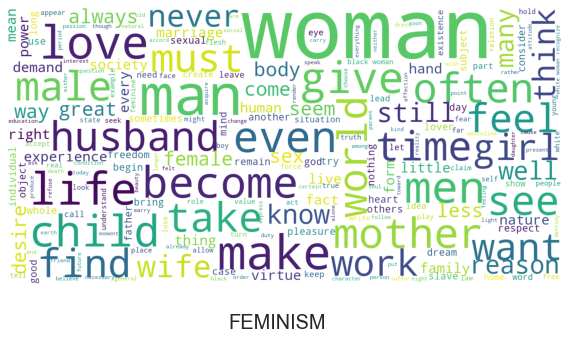

In [13]:
# worldclouds for each school
schools = df["school"].unique()
for school in schools:
    school_title = school.replace("_", " ").upper()
    df_temp = df[df.school==school]
    text = " ".join(txt for txt in df_temp.lem_sentence_without_additional_stop_words)
    display_wordcloud(text, school_title)

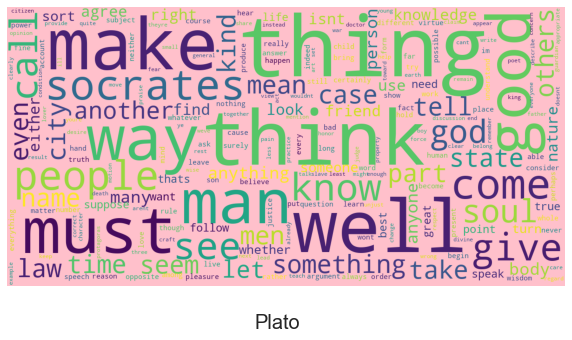

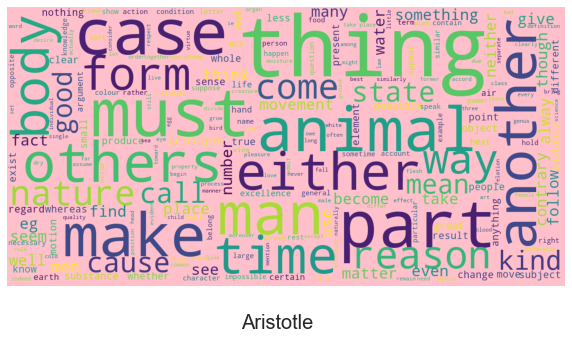

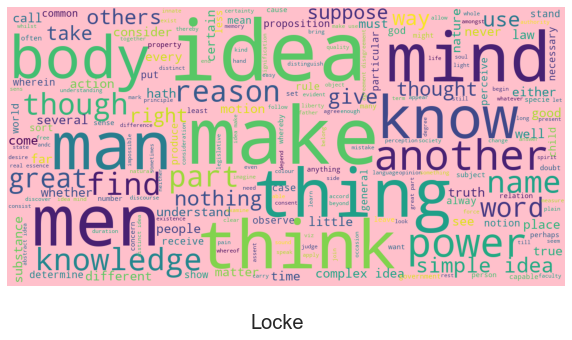

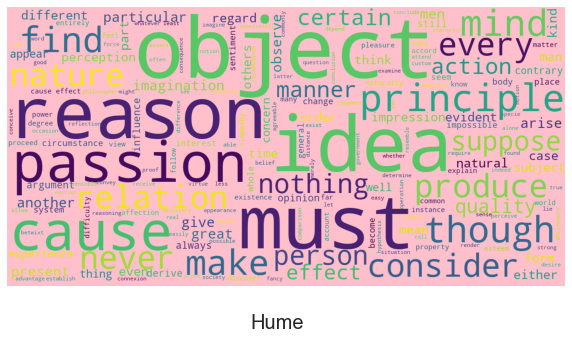

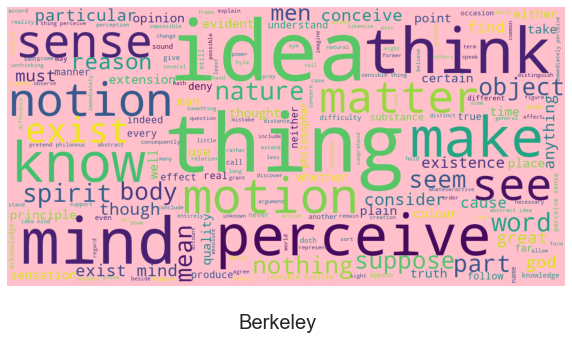

...

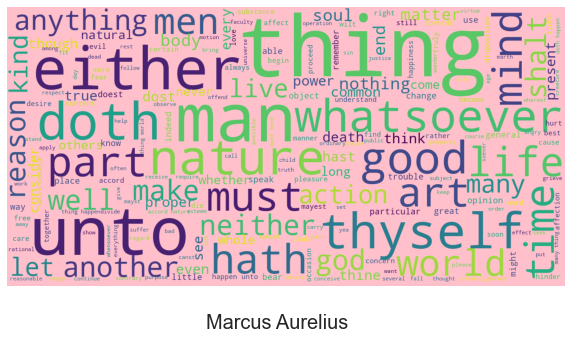

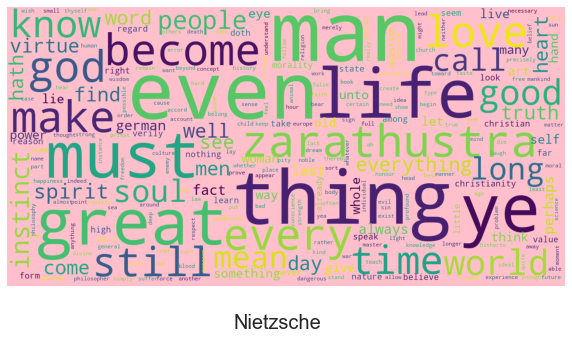

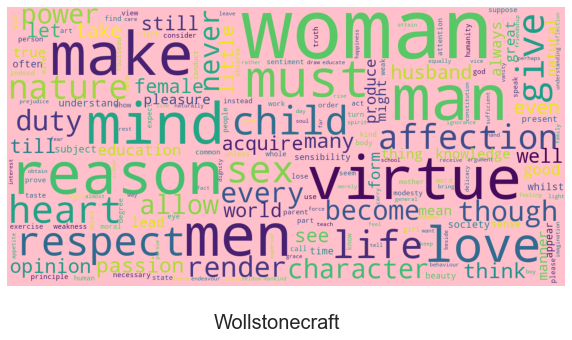

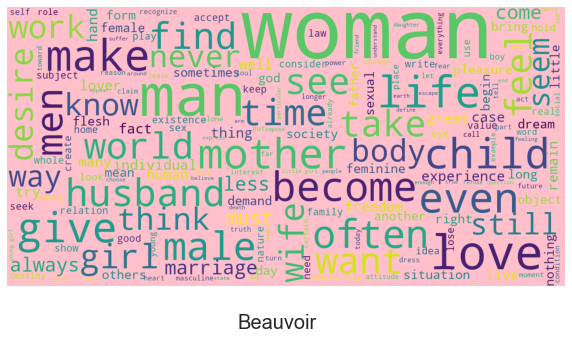

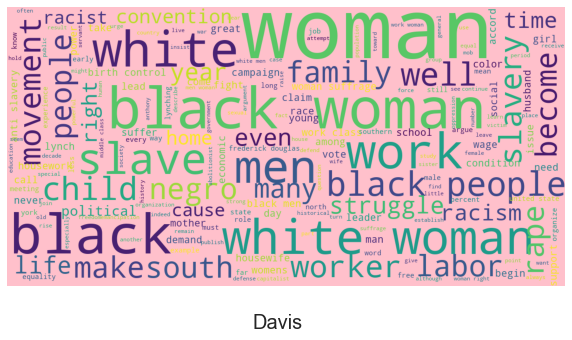

In [14]:
# worldclouds by author
authors = df["author"].unique()
for author in authors:
    #author_title = school.replace("_", " ").upper()
    df_temp = df[df.author==author]
    text = " ".join(txt for txt in df_temp.lem_sentence_without_additional_stop_words)
    display_wordcloud(text, author, 'pink')

## Topic Modeling using LDA

In [15]:
titles = df['title'].unique()
titles_text = {}

for title in titles:
    df_title = df[(df.title==title)]
    text = ' '.join(df_title['lem_sentence_without_additional_stop_words'])
    titles_text[title] = [text]
    
texts_df = pd.DataFrame(data=titles_text)
texts_df = texts_df.T

dataLDA = texts_df[0].values.tolist()


additional_stop_words = ['go', 'sure', 'new', 'list', 'back', 'say', 'one', 'two', 'without', 'much',
                        'whose', 'therefor', 'first', 'within', 'yet', 'would', 'also', 'second', 'whats',
                        'us', 'secondly', 'may', 'upon', 'more', 'thus', 'mine', 'thou', 'thy', 'thee', 'dont', 'eg', 'isnt', 'doesnt',
                        'thats']

In [16]:
st = stopwords.words('english')
st.extend(additional_stop_words)

tf_vectorizer = CountVectorizer(strip_accents = 'unicode', analyzer = 'word', stop_words = st, lowercase = True)
                               
dtm_tf = tf_vectorizer.fit_transform(dataLDA)

num_components=6
# create LDA object
model=LatentDirichletAllocation(n_components=num_components, random_state=1)
lda_matrix = model.fit(dtm_tf)
# model components 
lda_components=model.components_

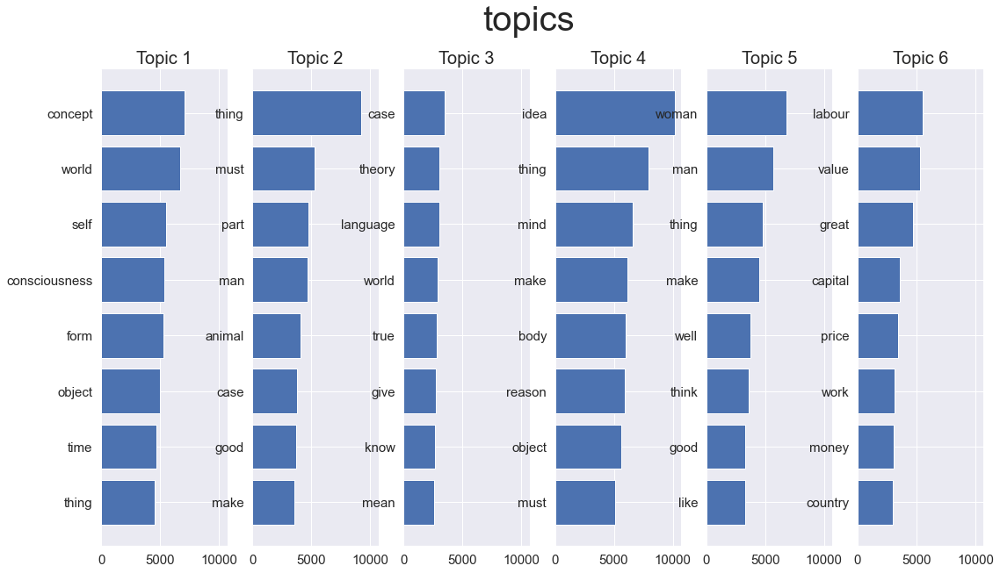

In [17]:
def top_words_per_topic(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(1, 6, figsize=(18, 10), sharex=True)
    axes = axes.flatten()
    for index, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[: -n_top_words - 1 : -1]
        top_features = [feature_names[i] for i in top_features_ind]
        counts = topic[top_features_ind]
        ax = axes[index]
        ax.barh(top_features, counts, height=0.8)
        ax.set_title(f"Topic {index+1}", fontdict={"fontsize": 20})
        ax.invert_yaxis()
        ax.tick_params(labelsize=15)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)
        path = "/Users/lsx/Desktop/LDA topics.png"
    plt.savefig(path, bbox_inches="tight")
    plt.show()
    
    plt.show()
feature_names = tf_vectorizer.get_feature_names()
top_words_per_topic(model, feature_names, 8, "topics")




In [18]:
doc_topic = model.transform(dtm_tf)
prob = {}
documents_topics_dict = {}
for n in range(doc_topic.shape[0]):
    topic_most_pr = doc_topic[n].argmax()
    documents_topics_dict[titles[n]] = topic_most_pr
    prob[titles[n]] = doc_topic[n].max()

In [19]:
mean2_df = df
schools_topics = mean2_df.loc[:, ['school', 'title']].drop_duplicates()
schools_topics['topic'] = schools_topics.apply (lambda row: documents_topics_dict[row.title]+1, axis=1)
schools_topics['similarity'] = schools_topics.apply (lambda row: prob[row.title], axis=1)
schools_topics_new = schools_topics.groupby(["school", "topic"])['similarity'].mean()
schools_topics_sim = schools_topics_new.to_frame().rename(columns={'mean':'new_name'}).reset_index()

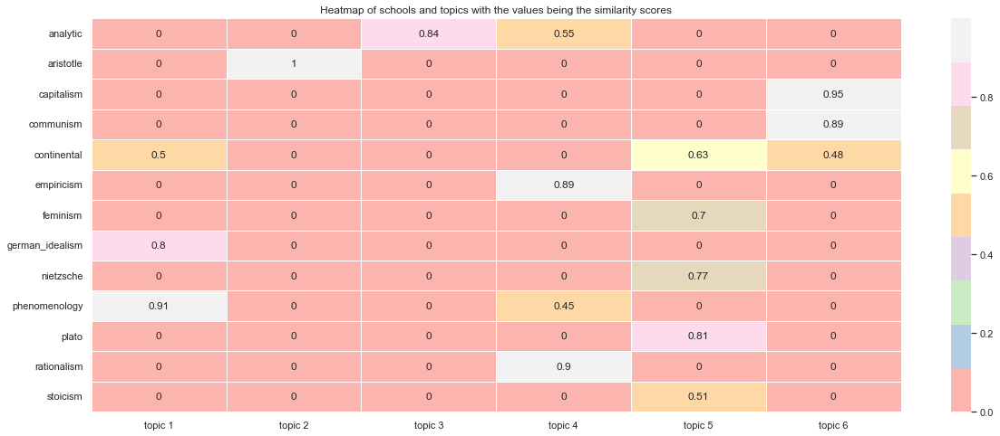

In [20]:
all_topics = []
for i in range(num_components):
    all_topics.append("topic " + str(i+1))

Cols = schools_topics_sim['school'].unique()
Index = all_topics

column_lists = {}
for col in Cols:
    column_lists[col] = [0] * num_components

for i in range(len(schools_topics_sim['school'])):
    column_lists[schools_topics_sim['school'][i]][schools_topics_sim['topic'][i]-1] = schools_topics_sim['similarity'][i]
    
column_lists
    
test = pd.DataFrame(column_lists, index=Index, columns=Cols)
test = test.transpose()
ax = sns.heatmap(test, cmap='Pastel1', linewidths=0.5, annot=True)
ax.set(title = "Heatmap of schools and topics with the values being the similarity scores")

path = "/Users/lsx/Desktop/heatmap.png"
ax.figure.savefig(path, bbox_inches="tight")

- Topic1: Consciousness and existational questions
- Topic2: human and nature
- Topic3: theory and language
- Topic4: thinking and human mind
- Topic5: woman and man (human)
- Topic6: Labour and capital

analytic : theory and language

continental: woman

nietzsche: woman
plato: woman
stoicism: woman

In [21]:
df = dataset.drop(columns = ["sentence_str", "sentence_length", "sentence_lowered", "lemmatized_str", "tokenized_txt"])

In [22]:
!pip install watermark
# print versions of Python modules and packages with watermark. (https://github.com/rasbt/watermark)
%load_ext watermark
%watermark -v -p numpy,pandas,nltk,syllables,matplotlib,sklearn,wordcloud

Python implementation: CPython
Python version       : 3.9.12
IPython version      : 8.2.0

numpy     : 1.21.5
pandas    : 1.4.2
nltk      : 3.7
syllables : 1.0.3
matplotlib: 3.5.1
sklearn   : 0.0
wordcloud : 1.8.2.2



In [23]:

print(dataset.shape)
dataset.head()

(360808, 18)


,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str,new_sentence_length,new_lowered_sentence,new_tokenized_sentence,tokens_without_stop_words,lemmatized_tokens,lem_tokens_without_additional_stop_words,lem_sentence_without_additional_stop_words
0,Plato - Complete Works,Plato,plato,"What's new, Socrates, to make you leave your ...","What's new, Socrates, to make you leave your ...",-350,1997,125,"what's new, socrates, to make you leave your ...","['what', 'new', 'socrates', 'to', 'make', 'you...","what be new , Socrates , to make -PRON- lea...",23,whats new socrates to make you leave your usu...,"[whats, new, socrates, to, make, you, leave, y...","[whats, new, socrates, make, leave, usual, hau...","[whats, new, socrates, make, leave, usual, hau...","[socrates, make, leave, usual, haunt, lyceum, ...",socrates make leave usual haunt lyceum spend t...
1,Plato - Complete Works,Plato,plato,Surely you are not prosecuting anyone before t...,Surely you are not prosecuting anyone before t...,-350,1997,69,surely you are not prosecuting anyone before t...,"['surely', 'you', 'are', 'not', 'prosecuting',...",surely -PRON- be not prosecute anyone before ...,13,surely you are not prosecuting anyone before t...,"[surely, you, are, not, prosecuting, anyone, b...","[surely, prosecuting, anyone, king, archon]","[surely, prosecute, anyone, king, archon]","[surely, prosecute, anyone, king, archon]",surely prosecute anyone king archon
2,Plato - Complete Works,Plato,plato,The Athenians do not call this a prosecution b...,The Athenians do not call this a prosecution b...,-350,1997,74,the athenians do not call this a prosecution b...,"['the', 'athenians', 'do', 'not', 'call', 'thi...",the Athenians do not call this a prosecution ...,12,the athenians do not call this a prosecution b...,"[the, athenians, do, not, call, this, a, prose...","[athenians, call, prosecution, indictment, eut...","[athenian, call, prosecution, indictment, euth...","[athenian, call, prosecution, indictment, euth...",athenian call prosecution indictment euthyphro
3,Plato - Complete Works,Plato,plato,What is this you say?,What is this you say?,-350,1997,21,what is this you say?,"['what', 'is', 'this', 'you', 'say']",what be this -PRON- say ?,5,what is this you say,"[what, is, this, you, say]",[say],[say],[],
4,Plato - Complete Works,Plato,plato,"Someone must have indicted you, for you are no...","Someone must have indicted you, for you are no...",-350,1997,101,"someone must have indicted you, for you are no...","['someone', 'must', 'have', 'indicted', 'you',...","someone must have indict -PRON- , for -PRON- ...",19,someone must have indicted you for you are not...,"[someone, must, have, indicted, you, for, you,...","[someone, must, indicted, going, tell, indicte...","[someone, must, indict, go, tell, indict, some...","[someone, must, indict, tell, indict, someone,...",someone must indict tell indict someone else


In [24]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360808 entries, 0 to 360807
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype 
---  ------                                      --------------   ----- 
 0   title                                       360808 non-null  object
 1   author                                      360808 non-null  object
 2   school                                      360808 non-null  object
 3   sentence_spacy                              360808 non-null  object
 4   sentence_str                                360808 non-null  object
 5   original_publication_date                   360808 non-null  int64 
 6   corpus_edition_date                         360808 non-null  int64 
 7   sentence_length                             360808 non-null  int64 
 8   sentence_lowered                            360808 non-null  object
 9   tokenized_txt                               360808 non-null  object
 10  lemmatiz

In [25]:
df = dataset.drop(columns = ["sentence_str", "sentence_length", "sentence_lowered", "lemmatized_str", "tokenized_txt"])
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360808 entries, 0 to 360807
Data columns (total 13 columns):
 #   Column                                      Non-Null Count   Dtype 
---  ------                                      --------------   ----- 
 0   title                                       360808 non-null  object
 1   author                                      360808 non-null  object
 2   school                                      360808 non-null  object
 3   sentence_spacy                              360808 non-null  object
 4   original_publication_date                   360808 non-null  int64 
 5   corpus_edition_date                         360808 non-null  int64 
 6   new_sentence_length                         360808 non-null  int64 
 7   new_lowered_sentence                        360808 non-null  object
 8   new_tokenized_sentence                      360808 non-null  object
 9   tokens_without_stop_words                   360808 non-null  object
 10  lemmatiz

In [26]:
tot_sentences = len(df["sentence_spacy"])
tot_sentences 


#The dataset contains 360808 sentences (rows) with 0 duplicated rows

360808

In [27]:
tot_titles = len(df["title"].unique())
tot_authors = len(df["author"].unique())
tot_schools = len(df["school"].unique())
(tot_titles,tot_authors,tot_schools)
#he dataset includes 59 books by 36 authors from 13 schools.

(59, 36, 13)

In [28]:
import nltk
nltk.download('cmudict')

  
d = cmudict.dict()

[nltk_data] Downloading package cmudict to /Users/lsx/nltk_data...
[nltk_data]   Package cmudict is already up-to-date!


In [29]:
def count_syllables(words):
    n = 0
    for word in words:
        try:
            n += [len(list(y for y in x if y[-1].isdigit())) for x in d[word.lower()]][0]
        except KeyError:
            n += syllables.estimate(word)
    return n

# use NLTK to tokenize the texts, because stopwords such as pronounce also impact the results of the readability score,
# I will not drop the stopwords at this stage
tokens_list = []
num_words_list = []
num_syllables_list = []
for idx in df.index:
    tokens = word_tokenize(df.sentence_spacy[idx])
    tokens = [w.lower() for w in tokens]
    tokens = [w for w in tokens if w.isalpha()]
    tokens_list.append(tokens)
    num_words_list.append(len(tokens))
    num_syllables_list.append(count_syllables(tokens))
df["tokenized_words"] = tokens_list
df["num_words"] = num_words_list
df["num_syllables"] = num_syllables_list

In [30]:
print(df["num_words"].describe())
print("------------------------------------")
print(df["num_syllables"].describe())

count    360808.000000
mean         26.293303
std          18.147527
min           0.000000
25%          13.000000
50%          22.000000
75%          35.000000
max         415.000000
Name: num_words, dtype: float64
------------------------------------
count    360808.000000
mean         40.847598
std          28.796219
min           0.000000
25%          20.000000
50%          34.000000
75%          54.000000
max         770.000000
Name: num_syllables, dtype: float64


In [31]:
# Sum up total number of words, syllables, and sentences for each text 
df_title = df.groupby(["title","author","school", "original_publication_date","corpus_edition_date"]).sum().reset_index().set_index("title")
df_title = df_title.join(df.groupby(["title"])["sentence_spacy"].count())
df_title = df_title.rename(columns = {"num_words": "tot_words", "num_syllables": "tot_syllables", "sentence_spacy": "tot_sens"})
df_title.head()

,author,school,original_publication_date,corpus_edition_date,new_sentence_length,tot_words,tot_syllables,tot_sens
title,,,,,,,,
"A General Theory Of Employment, Interest, And Money",Keynes,capitalism,1936,2003,114057,113565,184909,3411
A Treatise Concerning The Principles Of Human Knowledge,Berkeley,empiricism,1710,2009,34290,34295,51858,1040
A Treatise Of Human Nature,Hume,empiricism,1739,2003,222516,222614,359224,7047
Anti-Oedipus,Deleuze,continental,1972,1997,183144,182726,310571,6679
Aristotle - Complete Works,Aristotle,aristotle,-320,1991,1374162,1368824,1970568,48779


In [32]:
print(df_title["tot_words"].describe())
print("------------------------------------")
print(df_title["tot_syllables"].describe())
print("------------------------------------")
print(df_title["tot_sens"].describe())

count    5.900000e+01
mean     1.607938e+05
std      2.067161e+05
min      7.057000e+03
25%      5.537700e+04
50%      1.135650e+05
75%      1.888575e+05
max      1.368824e+06
Name: tot_words, dtype: float64
------------------------------------
count    5.900000e+01
mean     2.497990e+05
std      3.004124e+05
min      1.005800e+04
25%      8.106300e+04
50%      1.792240e+05
75%      3.101100e+05
max      1.970568e+06
Name: tot_syllables, dtype: float64
------------------------------------
count       59.000000
mean      6115.389831
std       7964.661865
min        323.000000
25%       1945.000000
50%       4469.000000
75%       7236.000000
max      48779.000000
Name: tot_sens, dtype: float64


In [33]:
# Flesch reading ease score
def FleschTest(totWords, totSyllables, totSentences):
    return 206.835 - 1.015*(totWords/totSentences) - 84.6*(totSyllables/totWords)
# Flesch-Kincaid grade level
def gradeTest(totWords, totSyllables, totSentences):
    return 0.39*(totWords/totSentences) + 11.8*(totSyllables/totWords) - 15.59

In [34]:
df_title["Flesch_score"] = np.round(FleschTest(df_title["tot_words"], df_title["tot_syllables"], df_title["tot_sens"]), 1)
df_title["grade_level"] = np.round(gradeTest(df_title["tot_words"], df_title["tot_syllables"], df_title["tot_sens"]))
df_title = df_title.sort_values("Flesch_score")
df_title.head()

,author,school,original_publication_date,corpus_edition_date,new_sentence_length,tot_words,tot_syllables,tot_sens,Flesch_score,grade_level
title,,,,,,,,,,
Discourse On Method,Descartes,rationalism,1637,2008,23018,23019,34047,340,13.0,28.0
The Crisis Of The European Sciences And Phenomenology,Husserl,phenomenology,1936,1970,150355,150089,263842,4832,26.6,17.0
The Order Of Things,Foucault,continental,1966,2002,172049,171240,281554,4689,30.7,18.0
Critique Of Judgement,Kant,german_idealism,1790,2007,153103,153146,250363,4204,31.6,18.0
The Birth Of The Clinic,Foucault,continental,1963,2003,76353,75578,128908,2518,32.1,16.0


In [35]:
print(df_title["Flesch_score"].describe())
print("------------------------------------")
print(df_title["grade_level"].describe())

count    59.000000
mean     46.035593
std      11.866437
min      13.000000
25%      38.950000
50%      45.400000
75%      52.700000
max      75.400000
Name: Flesch_score, dtype: float64
------------------------------------
count    59.000000
mean     13.728814
std       3.402993
min       6.000000
25%      12.000000
50%      14.000000
75%      15.000000
max      28.000000
Name: grade_level, dtype: float64


In [36]:
print('The book that is most difficult to read is "{t}" by {a} originally published in {y} with a Flesch reading-ease score of {s}'
     .format(t=df_title.index[0], a=df_title.iloc[0,0], y=df_title.iloc[0,1], s=df_title.iloc[0,-2]))


print('The book that is easiest to read is "{t}" by {a} originally published in {y} with a Flesch reading-ease score of {s}'
     .format(t=df_title.index[-1], a=df_title.iloc[-1,0], y=df_title.iloc[-1,1], s=df_title.iloc[-1,-2]))


The book that is most difficult to read is "Discourse On Method" by Descartes originally published in rationalism with a Flesch reading-ease score of 13.0
The book that is easiest to read is "Thus Spake Zarathustra" by Nietzsche originally published in nietzsche with a Flesch reading-ease score of 75.4


In [37]:
# Converting the score into the corresponding school level
def scoreToLevel(x):
    if x > 90:
        return "5th grade"
    elif x > 90:
        return "6th grade"
    elif x > 70:
        return "7th grade"
    elif x > 60:
        return "8th & 9th grade"
    elif x > 50:
        return "10th to 12th grade"
    elif x > 30:
        return "College"
    elif x > 10:
        return "College graduate"
    else:
        return "Professional"

In [38]:
school_level_list = []
for idx in range(len(df_title.index)):
    school_level_list.append(scoreToLevel(df_title["Flesch_score"][idx]))
df_title["school_level"] = school_level_list

counts = df_title.groupby(["school_level"])["school_level"].count()
counts = counts.reindex(["College graduate", "College", "10th to 12th grade", "8th & 9th grade", "7th grade"])
counts

school_level
College graduate       2
College               36
10th to 12th grade    14
8th & 9th grade        4
7th grade              3
Name: school_level, dtype: int64

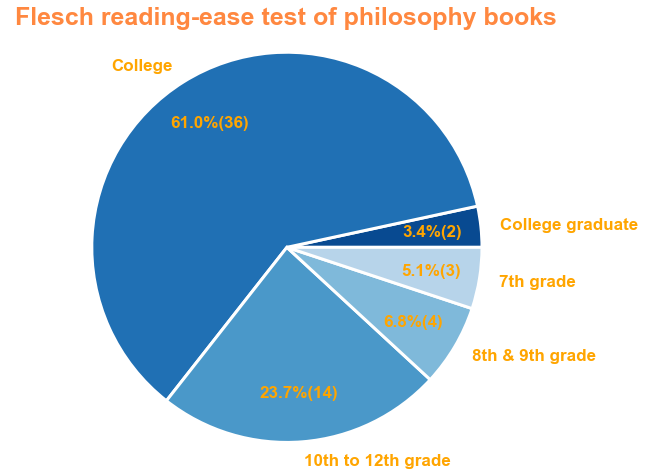

In [39]:
# Use a pie char to visualize the finding
plt.figure(figsize=[10,8])
colors = plt.get_cmap("Blues")(np.linspace(0.9, 0.3, len(counts)))
counts.plot(kind="pie",  colors=colors, 
            wedgeprops={"linewidth": 3, "edgecolor": "white"}, 
            autopct=lambda p: "{:.1f}%({:.0f})".format(p,(p/100)*counts.sum()), 
            pctdistance=0.75,
            textprops={"fontsize":17, "color":"#FFA500", "fontweight":"bold"})
plt.axis("equal")
plt.ylabel("")
plt.title("Flesch reading-ease test of philosophy books", fontsize=25, color="#FF8840", fontweight="bold", 
          horizontalalignment="center")

plt.savefig("/Users/lsx/Desktop/pie_chart.png")
plt.show()

In [40]:
df_title.drop(columns = {"tot_words", "tot_syllables", "tot_sens"}).head()

,author,school,original_publication_date,corpus_edition_date,new_sentence_length,Flesch_score,grade_level,school_level
title,,,,,,,,
Discourse On Method,Descartes,rationalism,1637,2008,23018,13.0,28.0,College graduate
The Crisis Of The European Sciences And Phenomenology,Husserl,phenomenology,1936,1970,150355,26.6,17.0,College graduate
The Order Of Things,Foucault,continental,1966,2002,172049,30.7,18.0,College
Critique Of Judgement,Kant,german_idealism,1790,2007,153103,31.6,18.0,College
The Birth Of The Clinic,Foucault,continental,1963,2003,76353,32.1,16.0,College


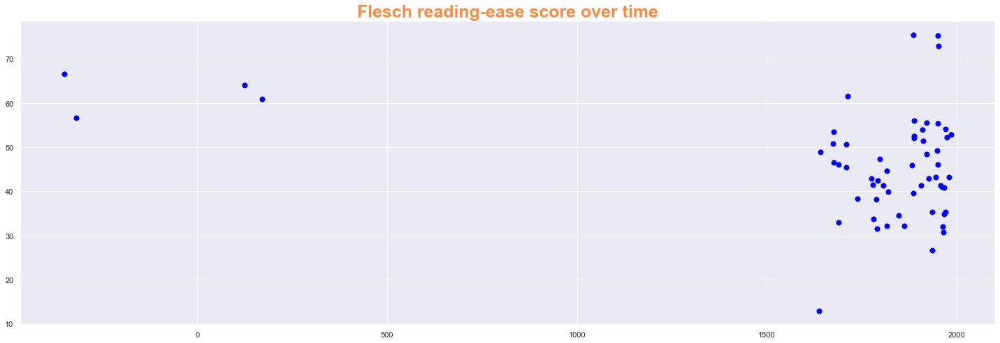

In [41]:
# plot all reading-ease score against the original publication date
plt.figure(figsize=[25,8])
plt.scatter(df_title["original_publication_date"],  df_title["Flesch_score"], s=50, c="blue")
plt.title("Flesch reading-ease score over time", fontsize=25, color="#FF8840", fontweight="bold", 
          horizontalalignment="center")
plt.show()

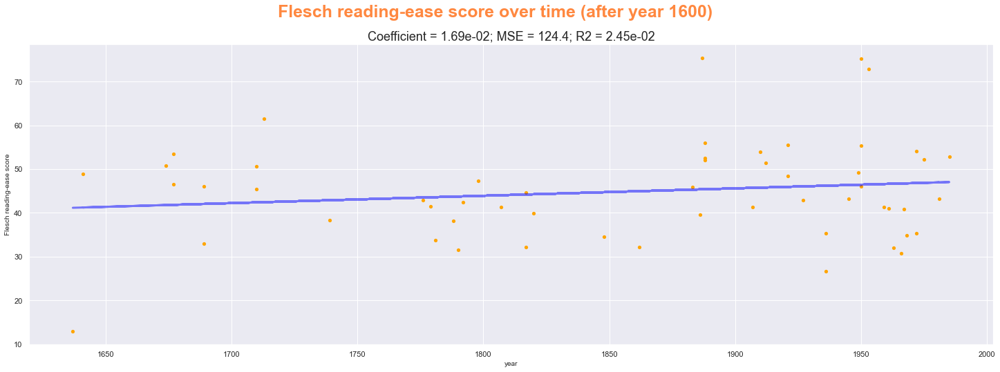

In [42]:
# after 1600
df_after_1600 = df_title[df_title["original_publication_date"]>1600]

x = df_after_1600["original_publication_date"].to_numpy().reshape(-1, 1)
y = df_after_1600["Flesch_score"]
reg = LinearRegression().fit(x,y)
y_pred = reg.predict(x)

fig, ax = plt.subplots(figsize=[25,8])
ax.plot(x, y_pred, color="blue", linewidth=3, alpha=0.5)
ax.scatter(x, y, linewidth=3, c="orange", s=5)
ax.set_xlabel("year", fontsize=10)
ax.set_ylabel("Flesch reading-ease score", fontsize=10)
plt.suptitle("Flesch reading-ease score over time (after year 1600)", fontsize=25, color="#FF8840", fontweight="bold")
plt.title("Coefficient = {:.2e}; MSE = {:.1f}; R2 = {:.2e}".format(reg.coef_[0], mean_squared_error(y, y_pred), r2_score(y, y_pred)), fontsize=18)


plt.savefig("/Users/lsx/Desktop/score_over_time.png")
plt.show()

In [43]:
schools = df_title.groupby(["school"])["Flesch_score"].mean()
s = pd.Series([df_title["Flesch_score"].mean()], index=["AVERAGE"])
schools = schools.append(s)
schools = schools.sort_values()
schools.describe()

count    14.000000
mean     47.781732
std       9.689290
min      35.800000
25%      41.200000
50%      44.650000
75%      55.054545
max      66.600000
dtype: float64

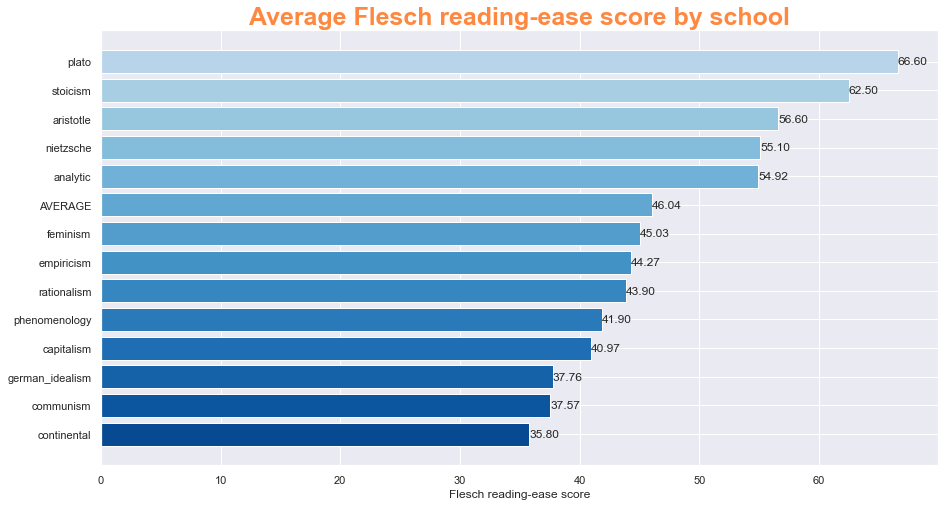

In [44]:
fig, ax = plt.subplots(figsize=[15,8])
colors = plt.get_cmap("Blues")(np.linspace(0.9, 0.3, len(schools)))
hbars = ax.barh(schools.index, schools.values, color=colors)
ax.set_xlabel("Flesch reading-ease score")
ax.bar_label(hbars, fmt='%.2f')
plt.title("Average Flesch reading-ease score by school", fontsize=25, color="#FF8840", fontweight="bold")
plt.savefig("/Users/lsx/Desktop/score_by_school.png")
plt.show()

In [45]:
authors = df_title.groupby(["author"])["Flesch_score"].mean()
authors = authors.append(s)
authors = authors.sort_values()
authors.describe()

count    37.000000
mean     46.398259
std       9.548558
min      30.950000
25%      39.900000
50%      46.035593
75%      52.900000
max      67.866667
dtype: float64

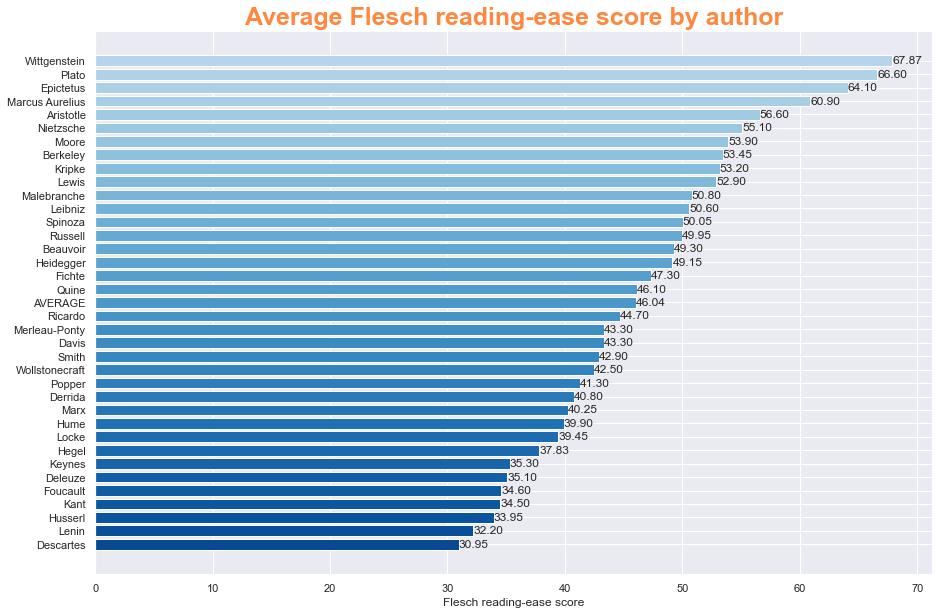

In [46]:
fig, ax = plt.subplots(figsize=[15,10])
colors = plt.get_cmap("Blues")(np.linspace(0.9, 0.3, len(authors)))
hbars = ax.barh(authors.index, authors.values, color=colors)
ax.set_xlabel("Flesch reading-ease score")
ax.bar_label(hbars, fmt='%.2f')
plt.title("Average Flesch reading-ease score by author", fontsize=25, color="#FF8840", fontweight="bold")
plt.savefig("/Users/lsx/Desktop/score_by_author.png")
plt.show()